In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import sctk as sk
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/HC_analysis/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [3]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [4]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


In [5]:
#first we profile human and mouse hair cells with the same, shared genes for downstream analysis
adata_mouse = sc.read("mouse_developmental_hc_python_human_id.h5ad")
print("adata_mouse dims: {}".format(adata_mouse.shape)) 

adata_mouse dims: (2915, 16823)


In [6]:
adata_mouse.X

<Compressed Sparse Column sparse matrix of dtype 'float64'
	with 6250435 stored elements and shape (2915, 16823)>

In [7]:
adata_mouse.layers["counts"] = adata_mouse.X.copy() 
adata_mouse.layers['counts']

<Compressed Sparse Column sparse matrix of dtype 'float64'
	with 6250435 stored elements and shape (2915, 16823)>

In [8]:
adata_mouse

AnnData object with n_obs × n_vars = 2915 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [9]:
adata_mouse_V2=adata_mouse.copy()

In [10]:
sc.pp.normalize_total(adata_mouse_V2, target_sum=1e4)
sc.pp.log1p(adata_mouse_V2)

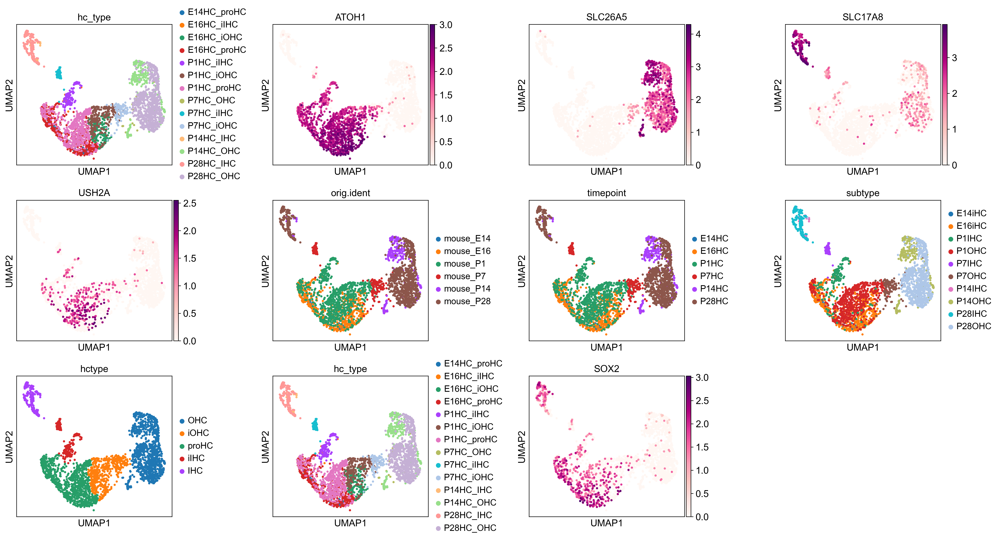

In [11]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse_V2,
    color=['hc_type','ATOH1','SLC26A5','SLC17A8','USH2A','orig.ident','timepoint', 'subtype','hctype', 'hc_type','SOX2'],wspace=0.5,
    frameon=True,
    
)#ncols = 1,

In [12]:
import scrublet as scr

In [13]:
# 初始化Scrublet对象
scrub_adata_mouse_V2 = scr.Scrublet(adata_mouse_V2.X)

# 检测双细胞
doublet_scores, predicted_doublets = scrub_adata_mouse_V2.scrub_doublets()

# 将结果添加到adata对象中
adata_mouse_V2.obs['doublet_score'] = doublet_scores
adata_mouse_V2.obs['predicted_doublet'] = predicted_doublets

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.49
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 62.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.2%
Elapsed time: 2.4 seconds


(<Figure size 1200x450 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

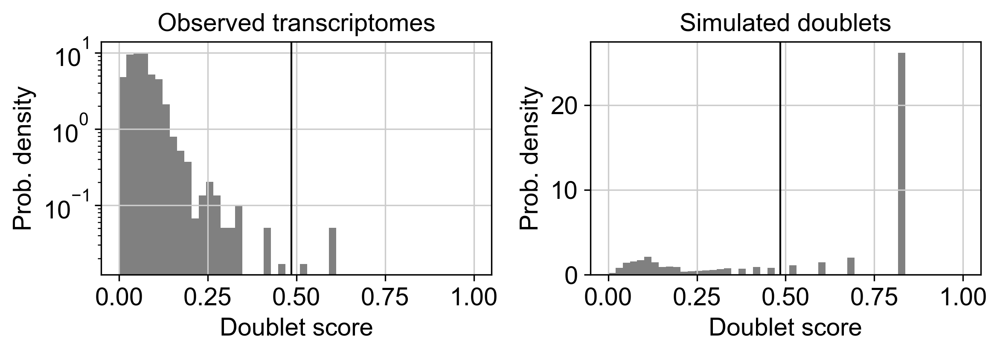

(<Figure size 1200x450 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

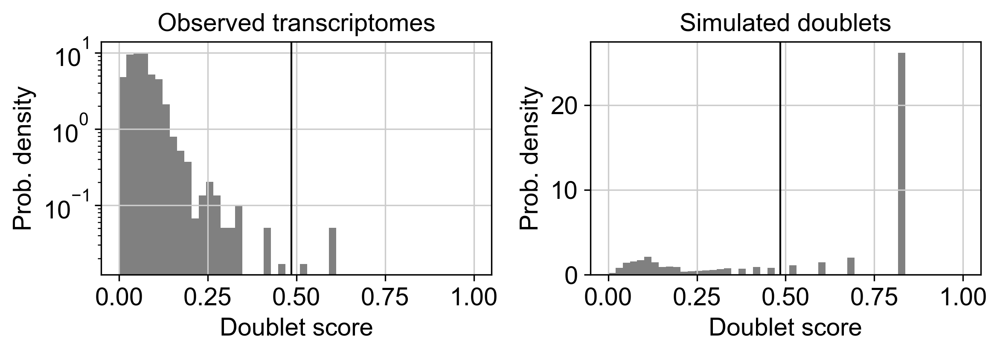

(<Figure size 1200x450 with 2 Axes>,
 array([<Axes: title={'center': 'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <Axes: title={'center': 'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

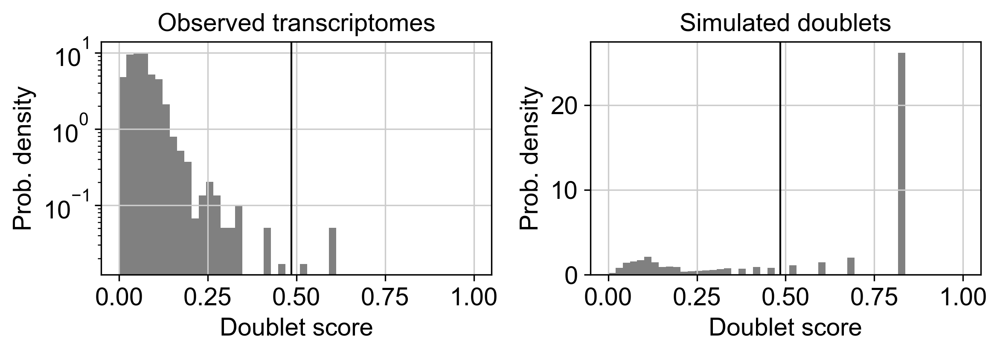

In [14]:
# 绘制双细胞得分直方图
scrub_adata_mouse_V2.plot_histogram()

# 显示图形
plt.show()
# 绘制双细胞得分直方图
scrub_adata_mouse_V2.plot_histogram()

# 显示图形
plt.show()
scrub_adata_mouse_V2.plot_histogram()

# 显示图形
plt.show()

In [15]:
# 过滤双细胞
adata_mouse_V2 = adata_mouse_V2[~adata_mouse_V2.obs['predicted_doublet'], :]

# 查看过滤后的数据
adata_mouse_V2

View of AnnData object with n_obs × n_vars = 2911 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'log1p', 'hc_type_colors', 'orig.ident_colors', 'timepoint_colors', 'subtype_colors', 'hctype_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

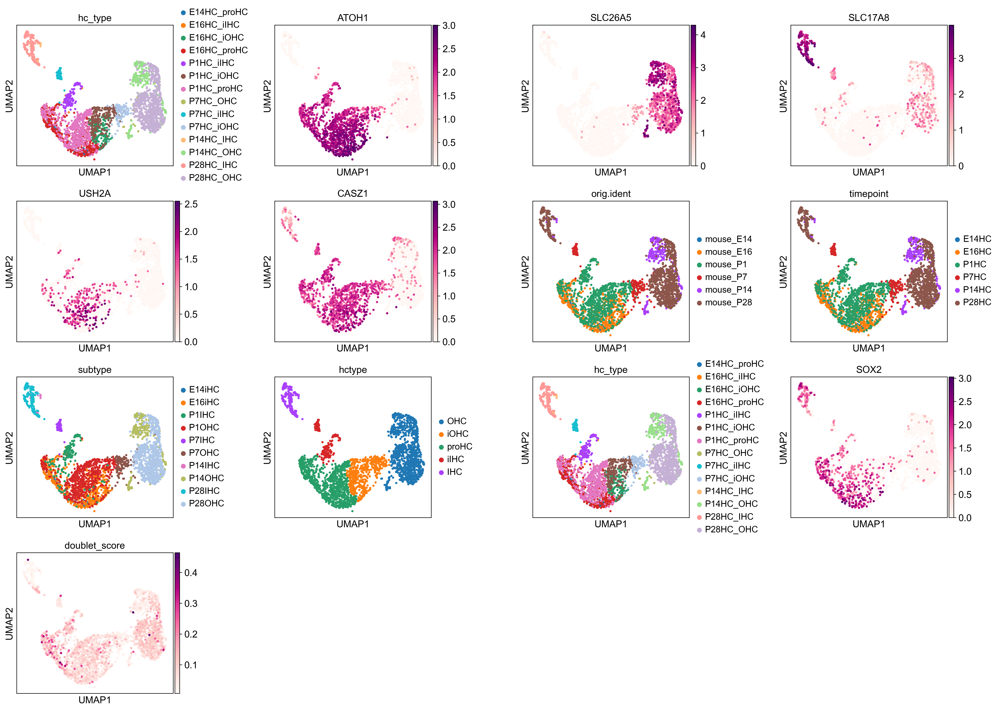

In [16]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse_V2,
    color=['hc_type','ATOH1','SLC26A5','SLC17A8','USH2A','CASZ1',
           'orig.ident','timepoint', 'subtype','hctype', 'hc_type','SOX2','doublet_score'],wspace=0.5,
    frameon=True,
    
)#ncols = 1,

In [17]:
# now we used our in-house mouse dataset in P21 to test whether sox2 expression in public p28 ihc is due to scrna/snrna sequencing or cell dissociation
adata_mouse=sc.read('mouse_p25_scvi.h5ad')

In [18]:
adata_mouse

AnnData object with n_obs × n_vars = 6017 × 32285
    obs: 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    uns: 'batch_colors', 'cell_type2_colors', 'cell_type_colors', 'cluster2_colors', 'leiden', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

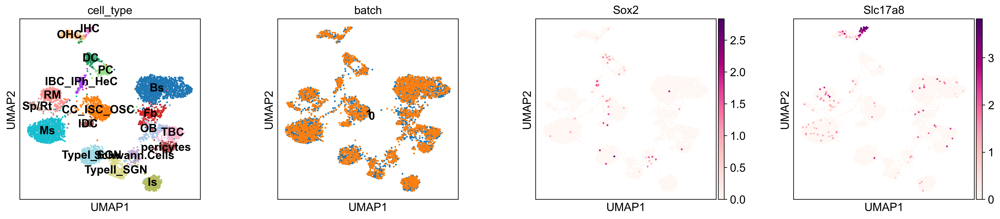

In [19]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse,
    color=['cell_type','batch','Sox2','Slc17a8',], legend_loc='on data',wspace=0.3,
    frameon=True,#
    save="cochlea-cell_type_mouse_p21_sox2.pdf"
)#ncols = 1,

In [20]:
include_clusters = ['IHC','OHC',]
adata_hc_p21= adata_mouse[adata_mouse.obs['cell_type'].isin(include_clusters), :]
adata_hc_p21

View of AnnData object with n_obs × n_vars = 225 × 32285
    obs: 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    uns: 'batch_colors', 'cell_type2_colors', 'cluster2_colors', 'leiden', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

In [21]:
sc.tl.umap(adata_hc_p21,min_dist=0.6)

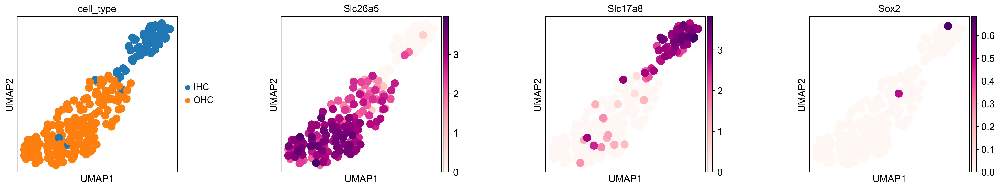

In [22]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_hc_p21,
    color=['cell_type','Slc26a5','Slc17a8',
          'Sox2',],wspace=0.5,
    frameon=True,ncols=4,
)#ncols = 1,

In [23]:
include_clusters = ['E14HC','E16HC','P1HC','P7HC','P14HC',]
adata_hc_p21_neg= adata_mouse_V2[adata_mouse_V2.obs['timepoint'].isin(include_clusters), :]
adata_hc_p21
adata_mouse_V2
adata_hc_p21_neg

AnnData object with n_obs × n_vars = 225 × 32285
    obs: 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    uns: 'batch_colors', 'cell_type2_colors', 'cluster2_colors', 'leiden', 'neighbors', 'umap', 'cell_type_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

View of AnnData object with n_obs × n_vars = 2911 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'log1p', 'hc_type_colors', 'orig.ident_colors', 'timepoint_colors', 'subtype_colors', 'hctype_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

View of AnnData object with n_obs × n_vars = 1969 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'log1p', 'hc_type_colors', 'orig.ident_colors', 'timepoint_colors', 'subtype_colors', 'hctype_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

In [24]:
adata_hc_p21.obs['timepoint']='P21HC'

In [25]:
cluster_annotation = {
 
    'OHC': 'P21HC_OHC',
     'IHC': 'P21IHC_IHC',

}
adata_hc_p21.obs['hc_type'] = adata_hc_p21.obs['cell_type'].map(cluster_annotation).astype('category')

In [26]:
cluster_annotation = {
 
    'OHC': 'P21OHC',
     'IHC': 'P21IHC',

}
adata_hc_p21.obs['subtype'] = adata_hc_p21.obs['cell_type'].map(cluster_annotation).astype('category')

In [27]:
adata_hc_p21.obs['timepoint'].value_counts()
adata_hc_p21.obs['hc_type'].value_counts()
adata_hc_p21.obs['subtype'].value_counts()

timepoint
P21HC    225
Name: count, dtype: int64

hc_type
P21HC_OHC     165
P21IHC_IHC     60
Name: count, dtype: int64

subtype
P21OHC    165
P21IHC     60
Name: count, dtype: int64

In [28]:
adata_hc_p21_neg.obs['timepoint'].value_counts()
adata_hc_p21_neg.obs['hc_type'].value_counts()
adata_hc_p21_neg.obs['subtype'].value_counts()

timepoint
P1HC     846
E16HC    582
P14HC    293
P7HC     190
E14HC     58
Name: count, dtype: int64

hc_type
P1HC_proHC     495
E16HC_proHC    403
P14HC_OHC      260
P1HC_iOHC      222
E16HC_iOHC     169
P1HC_iIHC      129
P7HC_iOHC      111
P7HC_iIHC       61
E14HC_proHC     58
P14HC_IHC       33
P7HC_OHC        18
E16HC_iIHC      10
Name: count, dtype: int64

subtype
P1OHC     665
E16iHC    582
P14OHC    260
P1IHC     181
P7OHC     129
P7IHC      61
E14iHC     58
P14IHC     33
Name: count, dtype: int64

In [29]:
# mouse gene id transfer into human gene id
from mousipy import translate
adata_hc_p21 = translate(adata_hc_p21)

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 32285/32285 [01:24<00:00, 382.09it/s]


Found direct orthologs for 16841 genes.
Found multiple orthologs for 775 genes.
Found no orthologs for 12370 genes.
Found no index in biomart for 2299 genes.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 775/775 [00:07<00:00, 100.43it/s]


In [30]:
adata_hc_p21_neg
adata_hc_p21

View of AnnData object with n_obs × n_vars = 1969 × 16823
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'log1p', 'hc_type_colors', 'orig.ident_colors', 'timepoint_colors', 'subtype_colors', 'hctype_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts'

AnnData object with n_obs × n_vars = 225 × 19593
    obs: 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5', 'timepoint', 'hc_type', 'subtype'
    var: 'gene_ids', 'feature_types', 'Gene', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'original_gene_symbol'
    uns: 'batch_colors', 'cell_type2_colors', 'cluster2_colors', 'leiden', 'neighbors', 'umap', 'cell_type_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'

In [31]:
adata_mouse_NEW=adata_hc_p21_neg.concatenate(adata_hc_p21
                                    )
adata_mouse_NEW

AnnData object with n_obs × n_vars = 2194 × 16205
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet', 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1', 'n_cells_by_counts-0-1', 'mean_counts-0-1

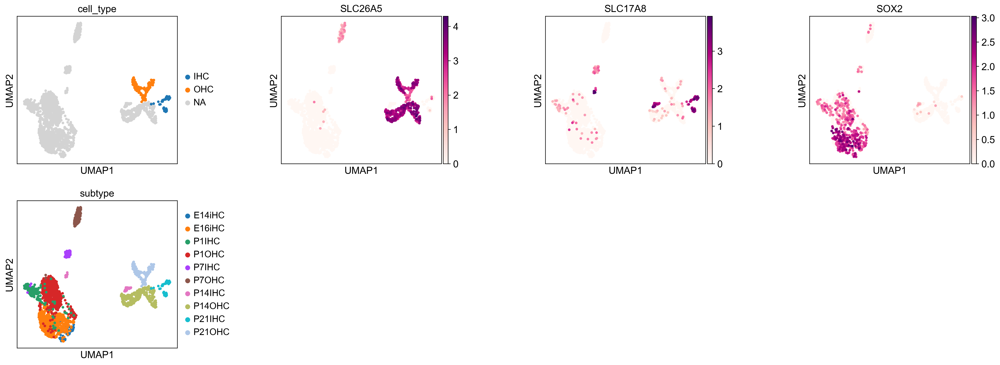

In [32]:

sc.pp.neighbors(adata_mouse_NEW)
sc.tl.umap(adata_mouse_NEW,min_dist=0.6)
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_mouse_NEW,
    color=['cell_type','SLC26A5','SLC17A8',
          'SOX2','subtype'],wspace=0.5,
    frameon=True,ncols=4,
)#ncols = 1,

In [33]:
adata_mouse_IHC=adata_mouse_NEW[adata_mouse_NEW.obs['subtype'].isin([ 'E16iHC','E14iHC','P1IHC','P7IHC','P14IHC','P21IHC', ])]
adata_mouse_IHC.obs['subtype'].value_counts()
adata_mouse_IHC.obs['timepoint'].value_counts()

subtype
E16iHC    582
P1IHC     181
P7IHC      61
P21IHC     60
E14iHC     58
P14IHC     33
Name: count, dtype: int64

timepoint
E16HC    582
P1HC     181
P7HC      61
P21HC     60
E14HC     58
P14HC     33
Name: count, dtype: int64

In [86]:
adata_mouse_IHC_E14=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'E14HC_proHC', ])]
adata_mouse_IHC_E14.obs['hc_type'].value_counts()
adata_mouse_IHC_E14.obs['timepoint'].value_counts()
adata_mouse_IHC_E14.obs['devtime']='1'
adata_mouse_IHC_E14.obs['devtime_age_bins']='Inner_HC_1'
adata_mouse_IHC_E16=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'E16HC_iIHC', ])]
adata_mouse_IHC_E16.obs['hc_type'].value_counts()
adata_mouse_IHC_E16.obs['timepoint'].value_counts()
adata_mouse_IHC_E16.obs['devtime']='1'
adata_mouse_IHC_E16.obs['devtime_age_bins']='Inner_HC_1'

hc_type
E14HC_proHC    58
Name: count, dtype: int64

timepoint
E14HC    58
Name: count, dtype: int64

hc_type
E16HC_iIHC    10
Name: count, dtype: int64

timepoint
E16HC    10
Name: count, dtype: int64

In [87]:
adata_mouse_IHC_P1=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P1HC_iIHC', ])]
adata_mouse_IHC_P1.obs['hc_type'].value_counts()
adata_mouse_IHC_P1.obs['timepoint'].value_counts()
adata_mouse_IHC_P1.obs['devtime']='2'
adata_mouse_IHC_P1.obs['devtime_age_bins']='Inner_HC_2'
adata_mouse_IHC_P7=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P7HC_iIHC', ])]
adata_mouse_IHC_P7.obs['hc_type'].value_counts()
adata_mouse_IHC_P7.obs['timepoint'].value_counts()
adata_mouse_IHC_P7.obs['devtime']='2'
adata_mouse_IHC_P7.obs['devtime_age_bins']='Inner_HC_2'

hc_type
P1HC_iIHC    126
Name: count, dtype: int64

timepoint
P1HC    126
Name: count, dtype: int64

hc_type
P7HC_iIHC    61
Name: count, dtype: int64

timepoint
P7HC    61
Name: count, dtype: int64

In [88]:
adata_mouse_IHC_P14=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P14HC_IHC', ])]
adata_mouse_IHC_P14.obs['hc_type'].value_counts()
adata_mouse_IHC_P14.obs['timepoint'].value_counts()
adata_mouse_IHC_P14.obs['devtime']='3'
adata_mouse_IHC_P14.obs['devtime_age_bins']='Inner_HC_3'
adata_mouse_IHC_P21=adata_mouse_IHC[adata_mouse_IHC.obs['hc_type'].isin([ 'P21IHC_IHC', ])]
adata_mouse_IHC_P21.obs['hc_type'].value_counts()
adata_mouse_IHC_P21.obs['timepoint'].value_counts()
adata_mouse_IHC_P21.obs['devtime']='3'
adata_mouse_IHC_P21.obs['devtime_age_bins']='Inner_HC_3'

hc_type
P14HC_IHC    33
Name: count, dtype: int64

timepoint
P14HC    33
Name: count, dtype: int64

hc_type
P21IHC_IHC    60
Name: count, dtype: int64

timepoint
P21HC    60
Name: count, dtype: int64

In [89]:
adata_mouse_IHC=adata_mouse_IHC_P21.concatenate(adata_mouse_IHC_P14,adata_mouse_IHC_P7,adata_mouse_IHC_P1,adata_mouse_IHC_E16,
                                                adata_mouse_IHC_E14
                                               )

In [90]:
sc.pp.normalize_total(adata_mouse_IHC, target_sum=1e4)
sc.pp.log1p(adata_mouse_IHC)

<Axes: ylabel='ATOH1'>

Text(0.5, 1.0, 'ATOH1')

<Axes: ylabel='SOX2'>

Text(0.5, 1.0, 'SOX2')

<Axes: ylabel='TMC1'>

Text(0.5, 1.0, 'TMC1')

<Axes: ylabel='TMC2'>

Text(0.5, 1.0, 'TMC2')

<Axes: ylabel='OTOF'>

Text(0.5, 1.0, 'OTOF')

<Axes: ylabel='SLC17A8'>

Text(0.5, 1.0, 'SLC17A8')

<Axes: ylabel='SLC7A14'>

Text(0.5, 1.0, 'SLC7A14')

<Axes: ylabel='FGF8'>

Text(0.5, 1.0, 'FGF8')

<Axes: ylabel='TBX2'>

Text(0.5, 1.0, 'TBX2')

<Axes: ylabel='INSM1'>

Text(0.5, 1.0, 'INSM1')

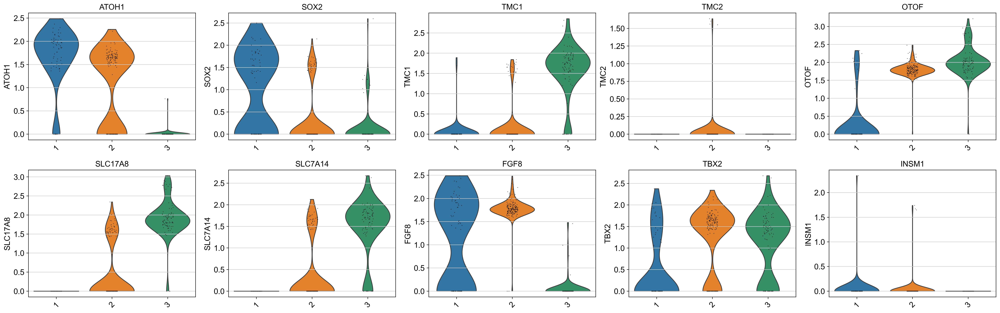

In [91]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_mouse_IHC.obs['devtime'].unique())
adata_mouse_IHC.obs['devtime'] = pd.Categorical(adata_mouse_IHC.obs['devtime'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_mouse_IHC.obs['devtime'] = adata_mouse_IHC.obs['devtime'].astype('category')

# List of genes to plot
genes = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'OTOF','SLC17A8','SLC7A14','FGF8',
         'TBX2', 'INSM1']#'CASZ1', UNDETECTED IN P21 IHC

# Create a figure with multiple subplots
n_genes = len(genes)
n_cols = 5  # Number of columns (subplots per row)
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate number of rows

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), squeeze=False)
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each gene in a separate subplot
for i, gene in enumerate(genes):
    ax = axes[i]
    sc.pl.violin(adata_mouse_IHC, gene, groupby='devtime', rotation=45, ax=ax, show=False)
    ax.set_title(gene)  # Set the title of each subplot to the gene name

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

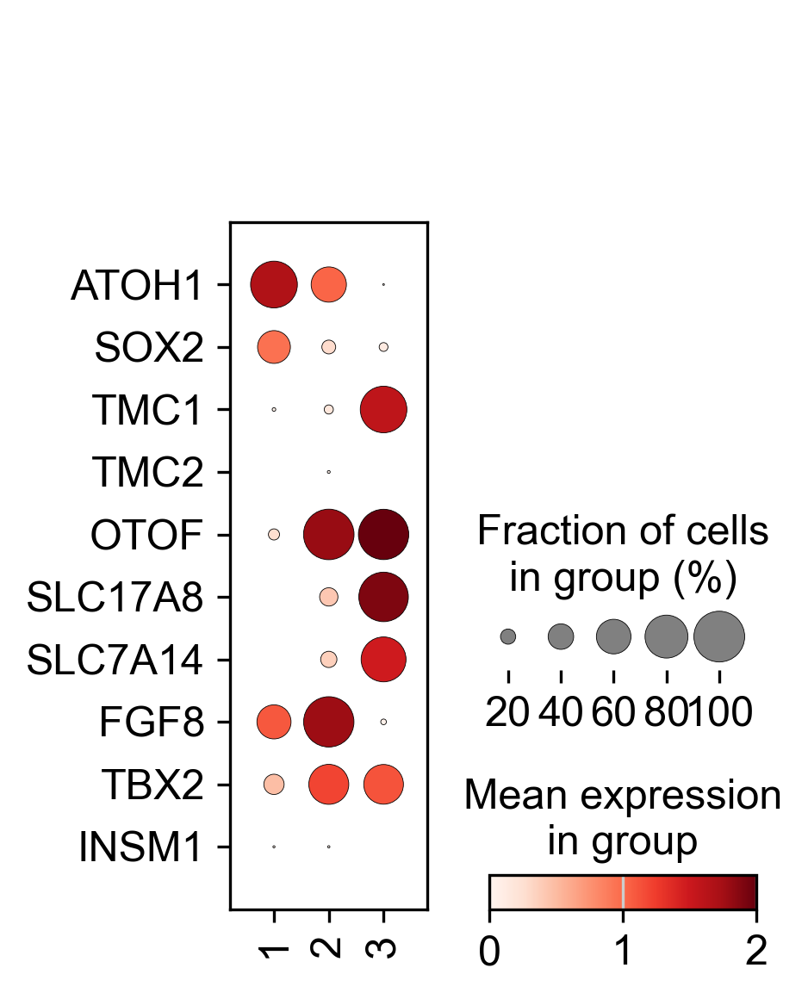

In [92]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(adata_mouse_IHC, var_names=genes, groupby='devtime', swap_axes=True,
             save="_mouse_developmental_inner_hc2_REVISION.pdf",vmax=2)#standard_scale='var'

In [93]:
adata_mouse_OHC=adata_mouse_NEW[adata_mouse_NEW.obs['subtype'].isin([ 'E16iHC','E14iHC','P1OHC','P7OHC','P14OHC','P21OHC' ])]
adata_mouse_OHC.obs['subtype'].value_counts()
adata_mouse_OHC.obs['timepoint'].value_counts()
adata_mouse_OHC_E14=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'E14HC_proHC', ])]
adata_mouse_OHC_E14.obs['hc_type'].value_counts()
adata_mouse_OHC_E14.obs['timepoint'].value_counts()
adata_mouse_OHC_E14.obs['devtime']='1'
adata_mouse_OHC_E14.obs['devtime_age_bins']='Outer_HC_1'

adata_mouse_OHC_E16=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'E16HC_iOHC', ])]
adata_mouse_OHC_E16.obs['hc_type'].value_counts()
adata_mouse_OHC_E16.obs['timepoint'].value_counts()
adata_mouse_OHC_E16.obs['devtime']='1'
adata_mouse_OHC_E16.obs['devtime_age_bins']='Outer_HC_1'

adata_mouse_OHC_P1=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P1HC_iOHC', ])]
adata_mouse_OHC_P1.obs['hc_type'].value_counts()
adata_mouse_OHC_P1.obs['timepoint'].value_counts()
adata_mouse_OHC_P1.obs['devtime']='2'
adata_mouse_OHC_P1.obs['devtime_age_bins']='Outer_HC_2'

adata_mouse_OHC_P7=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P7HC_iOHC', ])]
adata_mouse_OHC_P7.obs['hc_type'].value_counts()
adata_mouse_OHC_P7.obs['timepoint'].value_counts()
adata_mouse_OHC_P7.obs['devtime']='2'
adata_mouse_OHC_P7.obs['devtime_age_bins']='Outer_HC_2'

adata_mouse_OHC_P14=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P14HC_OHC', ])]
adata_mouse_OHC_P14.obs['hc_type'].value_counts()
adata_mouse_OHC_P14.obs['timepoint'].value_counts()
adata_mouse_OHC_P14.obs['devtime']='3'
adata_mouse_OHC_P14.obs['devtime_age_bins']='Outer_HC_3'

adata_mouse_OHC_P21=adata_mouse_OHC[adata_mouse_OHC.obs['hc_type'].isin([ 'P21HC_OHC', ])]
adata_mouse_OHC_P21.obs['hc_type'].value_counts()
adata_mouse_OHC_P21.obs['timepoint'].value_counts()
adata_mouse_OHC_P21.obs['devtime']='3'
adata_mouse_OHC_P21.obs['devtime_age_bins']='Outer_HC_3'

subtype
P1OHC     665
E16iHC    582
P14OHC    260
P21OHC    165
P7OHC     129
E14iHC     58
Name: count, dtype: int64

timepoint
P1HC     665
E16HC    582
P14HC    260
P21HC    165
P7HC     129
E14HC     58
Name: count, dtype: int64

hc_type
E14HC_proHC    58
Name: count, dtype: int64

timepoint
E14HC    58
Name: count, dtype: int64

hc_type
E16HC_iOHC    169
Name: count, dtype: int64

timepoint
E16HC    169
Name: count, dtype: int64

hc_type
P1HC_iOHC    217
Name: count, dtype: int64

timepoint
P1HC    217
Name: count, dtype: int64

hc_type
P7HC_iOHC    111
Name: count, dtype: int64

timepoint
P7HC    111
Name: count, dtype: int64

hc_type
P14HC_OHC    260
Name: count, dtype: int64

timepoint
P14HC    260
Name: count, dtype: int64

hc_type
P21HC_OHC    165
Name: count, dtype: int64

timepoint
P21HC    165
Name: count, dtype: int64

In [94]:
adata_mouse_OHC=adata_mouse_OHC_P21.concatenate(adata_mouse_OHC_P14,adata_mouse_OHC_P7,adata_mouse_OHC_P1,adata_mouse_OHC_E16,
                                                adata_mouse_OHC_E14
                                               )

In [95]:
sc.pp.normalize_total(adata_mouse_OHC, target_sum=1e4)
sc.pp.log1p(adata_mouse_OHC)

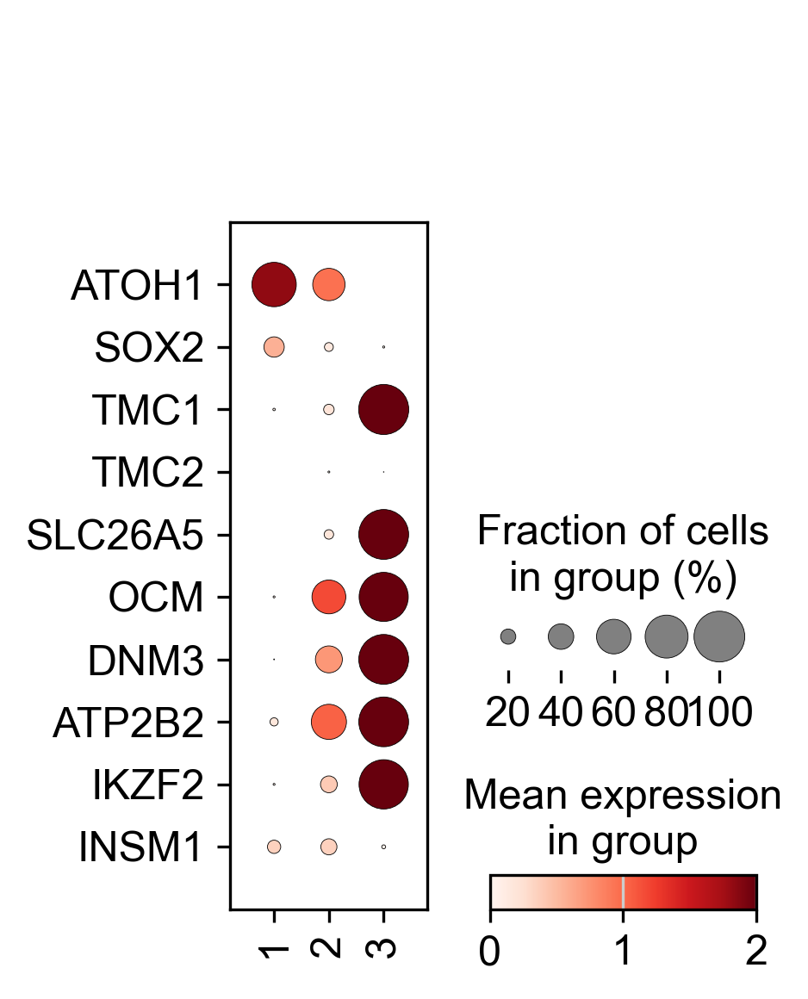

In [96]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_mouse_OHC.obs['devtime'].unique())
adata_mouse_OHC.obs['devtime'] = pd.Categorical(adata_mouse_OHC.obs['devtime'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_mouse_OHC.obs['devtime'] = adata_mouse_OHC.obs['devtime'].astype('category')
genes2 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'SLC26A5','OCM','DNM3','ATP2B2',
         'IKZF2', 'INSM1']#'CASZ1',
sc.pl.dotplot(adata_mouse_OHC, var_names=genes2, groupby='devtime',swap_axes=True,
             save="_mouse_developmental_outer_hc2_REVISION.pdf",vmax=2)#standard_scale='var'

In [97]:
adata_mouse_OHC.obs['age_bins2']=adata_mouse_OHC.obs['devtime']
adata_mouse_OHC.obs['age_bins2'].value_counts()
adata_mouse_OHC.obs['devtime'].value_counts()

age_bins2
3    425
2    328
1    227
Name: count, dtype: int64

devtime
3    425
2    328
1    227
Name: count, dtype: int64

In [98]:
adata_mouse_IHC.obs['age_bins2']=adata_mouse_IHC.obs['devtime']
adata_mouse_IHC.obs['age_bins2'].value_counts()
adata_mouse_IHC.obs['devtime'].value_counts()

age_bins2
2    187
3     93
1     68
Name: count, dtype: int64

devtime
2    187
3     93
1     68
Name: count, dtype: int64

In [99]:
adata_human = sc.read("human_developmental_hc_python_human_id.h5ad")
print("adata_human dims: {}".format(adata_human.shape))

adata_human dims: (203, 16569)


In [100]:
adata_human.obs["cell_type_final_v4_age"] = (
    adata_human.obs["cell_type_final_v4"].astype(str) + "_" + adata_human.obs["age_bins2"].astype(str)
)

In [101]:
adata_human_IHC=adata_human[adata_human.obs['cell_type_final_v4'].isin([ 'Inner_HC', ])]
adata_human_IHC.obs['cell_type_final_v4'].value_counts()
adata_human_OHC=adata_human[adata_human.obs['cell_type_final_v4'].isin([ 'Outer_HC', ])]
adata_human_OHC.obs['cell_type_final_v4'].value_counts()

cell_type_final_v4
Inner_HC    109
Name: count, dtype: int64

cell_type_final_v4
Outer_HC    94
Name: count, dtype: int64

In [102]:
#sc.pp.regress_out(adata_human_IHC, ['total_counts'])
#sc.pp.scale(adata_human_IHC, max_value=10)
sc.pp.normalize_total(adata_human_IHC, target_sum=1e4)
sc.pp.log1p(adata_human_IHC)
sc.pp.normalize_total(adata_human_OHC, target_sum=1e4)
sc.pp.log1p(adata_human_OHC)

<Axes: ylabel='ATOH1'>

Text(0.5, 1.0, 'ATOH1')

<Axes: ylabel='SOX2'>

Text(0.5, 1.0, 'SOX2')

<Axes: ylabel='TMC1'>

Text(0.5, 1.0, 'TMC1')

<Axes: ylabel='TMC2'>

Text(0.5, 1.0, 'TMC2')

<Axes: ylabel='OTOF'>

Text(0.5, 1.0, 'OTOF')

<Axes: ylabel='SLC17A8'>

Text(0.5, 1.0, 'SLC17A8')

<Axes: ylabel='SLC7A14'>

Text(0.5, 1.0, 'SLC7A14')

<Axes: ylabel='FGF8'>

Text(0.5, 1.0, 'FGF8')

<Axes: ylabel='TBX2'>

Text(0.5, 1.0, 'TBX2')

<Axes: ylabel='CASZ1'>

Text(0.5, 1.0, 'CASZ1')

<Axes: ylabel='INSM1'>

Text(0.5, 1.0, 'INSM1')

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

(0.0, 1.0, 0.0, 1.0)

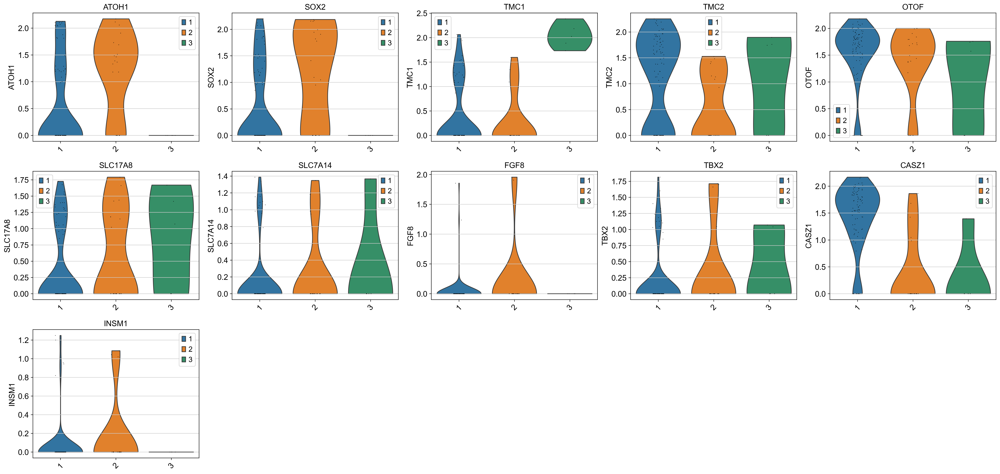

In [103]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_human_IHC.obs['age_bins2'].unique())
adata_human_IHC.obs['age_bins2'] = pd.Categorical(adata_human_IHC.obs['age_bins2'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_human_IHC.obs['age_bins2'] = adata_human_IHC.obs['age_bins2'].astype('category')

# List of genes to plot
genes = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'OTOF','SLC17A8','SLC7A14','FGF8',
         'TBX2', 'CASZ1','INSM1']

# Create a figure with multiple subplots
n_genes = len(genes)
n_cols = 5  # Number of columns (subplots per row)
n_rows = (n_genes + n_cols - 1) // n_cols  # Calculate number of rows

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), squeeze=False)
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each gene in a separate subplot
for i, gene in enumerate(genes):
    ax = axes[i]
    sc.pl.violin(adata_human_IHC, gene, groupby='age_bins2', rotation=45, ax=ax, show=False)
    ax.set_title(gene)  # Set the title of each subplot to the gene name

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

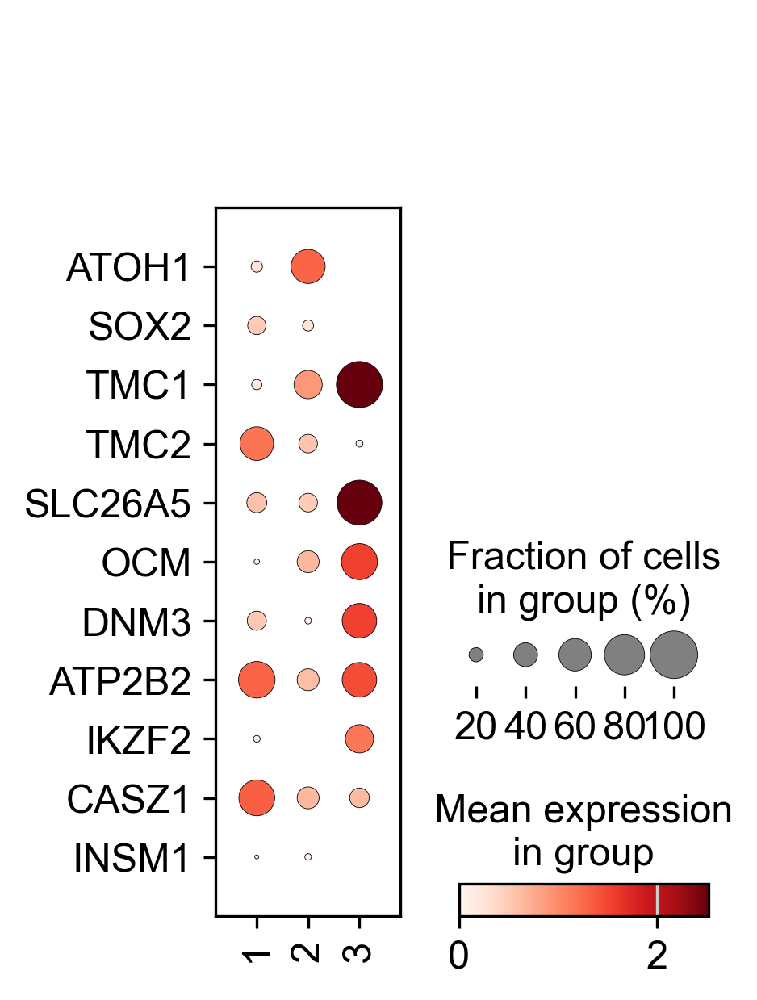

In [104]:
# Convert to categorical and specify the order if necessary
age_bins_order = sorted(adata_human_OHC.obs['age_bins2'].unique())
adata_human_OHC.obs['age_bins2'] = pd.Categorical(adata_human_OHC.obs['age_bins2'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_human_OHC.obs['age_bins2'] = adata_human_OHC.obs['age_bins2'].astype('category')
genes2 = ['ATOH1', 'SOX2', 
         'TMC1','TMC2',
          'SLC26A5','OCM','DNM3','ATP2B2',
         'IKZF2', 'CASZ1','INSM1']
sc.pl.dotplot(adata_human_OHC, var_names=genes2, groupby='age_bins2',swap_axes=True, 
             save="_human_developmental_outer_hc2.pdf",)#standard_scale='var'

## gene-set signiture scoring

In [105]:
adata_mouse=adata_mouse_OHC_P21.concatenate(adata_mouse_OHC_P14,adata_mouse_OHC_P7,adata_mouse_OHC_P1,adata_mouse_OHC_E16,
                                                adata_mouse_OHC_E14,adata_mouse_IHC_P21,
                                            adata_mouse_IHC_P14,adata_mouse_IHC_P7,adata_mouse_IHC_P1,adata_mouse_IHC_E16,
                                                adata_mouse_IHC_E14
                                               )
adata_mouse
sc.pp.normalize_total(adata_mouse, target_sum=1e4)
sc.pp.log1p(adata_mouse)
age_bins_order = sorted(adata_mouse.obs['devtime'].unique())
adata_mouse.obs['devtime'] = pd.Categorical(adata_mouse.obs['devtime'], categories=age_bins_order, ordered=True)

# Ensure 'age_bins2' is categorical
adata_mouse.obs['devtime'] = adata_mouse.obs['devtime'].astype('category')

AnnData object with n_obs × n_vars = 1328 × 16205
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet', 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5', 'devtime', 'devtime_age_bins', 'age_bins2'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1

In [106]:
# 更严格的基因过滤版本
import re
def strict_gene_filter(adata, inplace=True):
    """
    严格过滤基因，移除更多不需要的基因类型
    """
    if not inplace:
        adata = adata.copy()
    
    all_genes = adata.var_names.tolist()
    
    # 扩展的过滤模式
    patterns_to_remove = [
        # 核糖体
        re.compile(r'^RP[SL]\d|^RPL|^RPS|^MRPL|^MRPS', re.IGNORECASE),
        # 线粒体
        re.compile(r'^MT-|^MT\.|^MTRNR', re.IGNORECASE),
        # 血蛋白
        re.compile(r'^HB[ABDEGMQSTZ]|^HBA|^HBB|^HBD|^HBE', re.IGNORECASE),
        # 免疫相关（可选）
        re.compile(r'^IG[HKL][VJC]|^TR[ABGD][VCJ]', re.IGNORECASE),
        # 核仁
        re.compile(r'^NPM1|^FBL|^NOP', re.IGNORECASE),
    ]
    
    # 扩展的细胞周期基因列表
    extended_cell_cycle = [
        'MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6',
        'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'CENPU', 'HELLS', 'RFC2', 'RPA2', 'NASP',
        'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2',
        'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2',
        'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8', 'HMGB2', 'CDK1', 'NUSAP1',
        'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67',
        'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB',
        'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'JPT1',
        'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8',
        'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF',
        'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA',
        # 额外的细胞周期相关基因
        'CCNA2', 'CCNB1', 'CCND1', 'CCNE1', 'CDK2', 'CDK4', 'CDK6', 'E2F1', 'E2F2', 'E2F3','XIST',
    ]
    
    genes_to_keep = []
    genes_to_remove = []
    
    for gene in all_genes:
        gene_upper = gene.upper()
        should_remove = False
        
        # 检查正则表达式模式
        for pattern in patterns_to_remove:
            if pattern.match(gene):
                should_remove = True
                break
        
        # 检查细胞周期基因
        if not should_remove and gene_upper in extended_cell_cycle:
            should_remove = True
        
        if should_remove:
            genes_to_remove.append(gene)
        else:
            genes_to_keep.append(gene)
    
    print(f"严格过滤结果:")
    print(f"原始基因数量: {len(all_genes)}")
    print(f"移除基因数量: {len(genes_to_remove)}")
    print(f"保留基因数量: {len(genes_to_keep)}")
    
    # 过滤数据
    if inplace:
        adata._inplace_subset_var(genes_to_keep)
        return None
    else:
        return adata[:, genes_to_keep].copy()

# 使用严格过滤
print("应用严格基因过滤...")
adata_human_strict = strict_gene_filter(adata_human, inplace=False)
adata_mouse_strict = strict_gene_filter(adata_mouse, inplace=False)
adata_human_strict
adata_mouse_strict

应用严格基因过滤...
严格过滤结果:
原始基因数量: 16569
移除基因数量: 299
保留基因数量: 16270
严格过滤结果:
原始基因数量: 16205
移除基因数量: 335
保留基因数量: 15870


AnnData object with n_obs × n_vars = 203 × 16270
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet_scrub', 'X_scvi_batch', 'X_scvi_labels', 'age_bins', 'age_bins2', 'cellid', 'RNA_snn_res.0.8', 'seurat_clusters', 'cell_type_final_v4_age'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca', 'X_umap'

AnnData object with n_obs × n_vars = 1328 × 15870
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet', 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5', 'devtime', 'devtime_age_bins', 'age_bins2'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1

In [109]:
adata_mouse_strict

AnnData object with n_obs × n_vars = 1328 × 15870
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet', 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5', 'devtime', 'devtime_age_bins', 'age_bins2'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0', 'gene_ids-1', 'feature_types-1', 'Gene-1', 'mt-1

In [110]:
adata_mouse_strict.obs["devtime_age_bins"].value_counts()

devtime_age_bins
Outer_HC_3    425
Outer_HC_2    328
Outer_HC_1    227
Inner_HC_2    187
Inner_HC_3     93
Inner_HC_1     68
Name: count, dtype: int64

In [112]:
adata_mouse_strict.obs['species']='mouse'
adata_human_strict.obs['species']='human'

In [115]:
adata_human_strict.obs['devtime_age_bins']= adata_human_strict.obs['cell_type_final_v4_age']

In [116]:
adata_human_strict.obs["devtime_age_bins_species"] = (
    adata_human_strict.obs["devtime_age_bins"].astype(str) + "_" + adata_human_strict.obs["species"].astype(str)
)
adata_mouse_strict.obs["devtime_age_bins_species"] = (
    adata_mouse_strict.obs["devtime_age_bins"].astype(str) + "_" + adata_mouse_strict.obs["species"].astype(str)
)

In [117]:
%run _markers_v2.py

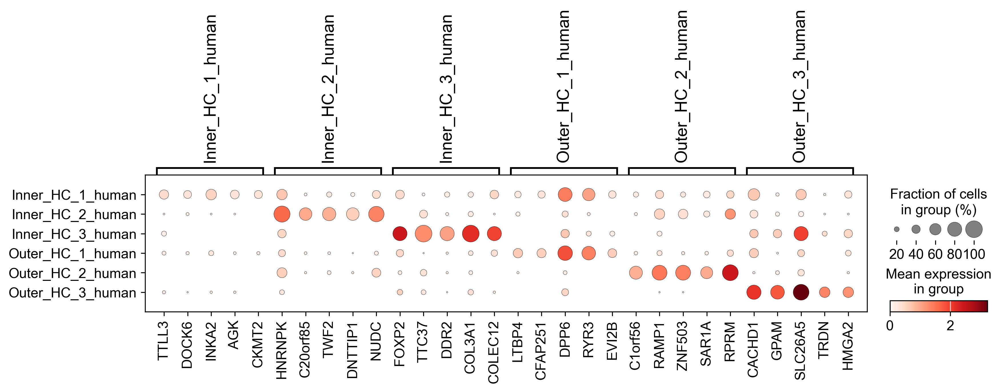

In [118]:
# HUMAN HC
adata_human_strict.obs['devtime_age_bins_species'] = adata_human_strict.obs['devtime_age_bins_species'].astype('category')
mkst_HU_HC = calc_marker_stats(adata_human_strict, 'devtime_age_bins_species',use_rep=False,)
mks_HU_HC = filter_marker_stats(mkst_HU_HC, max_next_frac=0.2, min_mean_diff=0.3, how='or')
plot_markers(adata_human_strict, 'devtime_age_bins_species', mks_HU_HC, )#standard_scale='var',

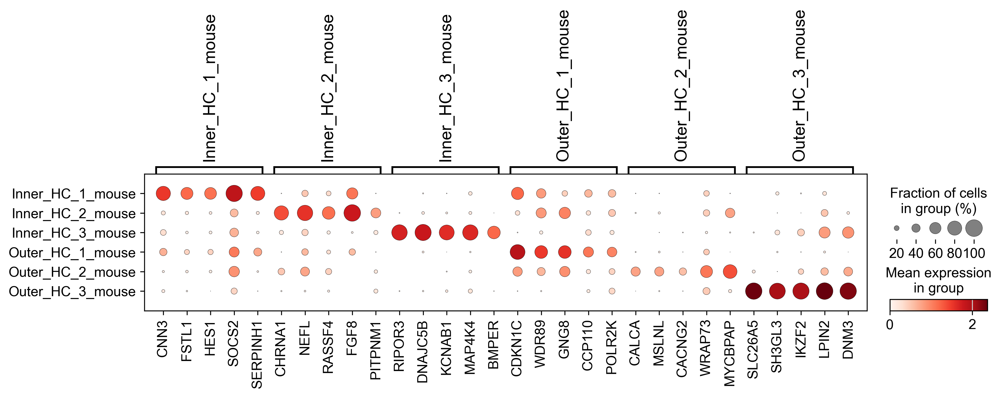

In [177]:
# mouse HC
adata_mouse_strict.obs['devtime_age_bins_species'] = adata_mouse_strict.obs['devtime_age_bins_species'].astype('category')
mkst_MU_HC = calc_marker_stats(adata_mouse_strict, 'devtime_age_bins_species',use_rep=False,)
mks_MU_HC = filter_marker_stats(mkst_MU_HC, max_next_frac=0.7, min_mean_diff=0.3, how='or')
plot_markers(adata_mouse_strict, 'devtime_age_bins_species', mks_MU_HC, )#standard_scale='var',

In [186]:
adata_human_strict_IHC=adata_human_strict[adata_human_strict.obs['devtime_age_bins'].isin([ 'Inner_HC_1', 'Inner_HC_2','Inner_HC_3',])]
adata_human_strict_IHC.obs['devtime_age_bins'].value_counts()

devtime_age_bins
Inner_HC_1    85
Inner_HC_2    19
Inner_HC_3     5
Name: count, dtype: int64

In [188]:
adata_human_strict_OHC=adata_human_strict[adata_human_strict.obs['devtime_age_bins'].isin([ 'Outer_HC_1', 'Outer_HC_2','Outer_HC_3',])]
adata_human_strict_OHC.obs['devtime_age_bins'].value_counts()

devtime_age_bins
Outer_HC_1    54
Outer_HC_3    26
Outer_HC_2    14
Name: count, dtype: int64

In [189]:
adata_mouse_strict.obs['devtime_age_bins_species'].value_counts()

devtime_age_bins_species
Outer_HC_3_mouse    425
Outer_HC_2_mouse    328
Outer_HC_1_mouse    227
Inner_HC_2_mouse    187
Inner_HC_3_mouse     93
Inner_HC_1_mouse     68
Name: count, dtype: int64

In [204]:
adata_mouse_strict_OHC=adata_mouse_strict[adata_mouse_strict.obs['devtime_age_bins'].isin([ 'Outer_HC_1', 'Outer_HC_2','Outer_HC_3',])]
adata_mouse_strict_OHC.obs['devtime_age_bins'].value_counts()
adata_mouse_strict_IHC=adata_mouse_strict[adata_mouse_strict.obs['devtime_age_bins'].isin([ 'Inner_HC_1', 'Inner_HC_2','Inner_HC_3',])]
adata_mouse_strict_IHC.obs['devtime_age_bins'].value_counts()

devtime_age_bins
Outer_HC_3    425
Outer_HC_2    328
Outer_HC_1    227
Name: count, dtype: int64

devtime_age_bins
Inner_HC_2    187
Inner_HC_3     93
Inner_HC_1     68
Name: count, dtype: int64

In [179]:
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster = 'Inner_HC_1_mouse'
cluster_genes = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster].sort_values('frac_diff', ascending=False).head(100)
gene_list = cluster_genes.index.tolist() # 取第一列

print(f"Cluster {cluster}: 使用 {len(gene_list)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict, gene_list, score_name=f'score_{cluster}')

第一列的名称: top_frac_group
Cluster Inner_HC_1_mouse: 使用 100 个基因进行打分


第一列的名称: top_frac_group
Cluster Inner_HC_1_mouse: 使用 100 个基因进行打分


<Axes: ylabel='score_Inner_HC_1_mouse'>

(-0.2, 0.6)

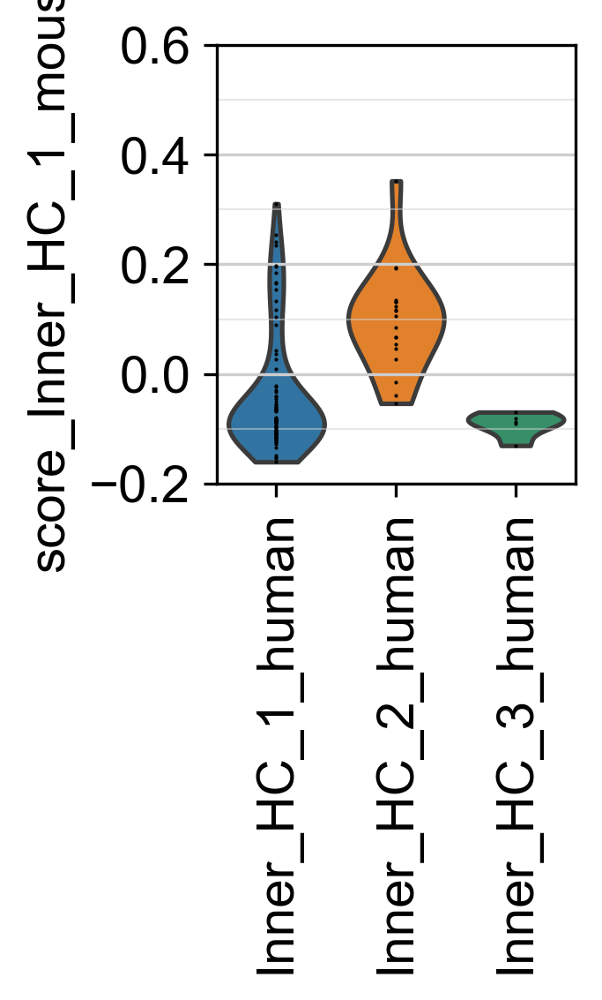

In [194]:
import matplotlib.pyplot as plt
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster1 = 'Inner_HC_1_mouse'
cluster_genes1 = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster1].sort_values('frac_diff', ascending=False).head(100)
gene_list1 = cluster_genes1.index.tolist() # 取第一列

print(f"Cluster {cluster1}: 使用 {len(gene_list1)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict_IHC, gene_list1, score_name=f'score_{cluster1}')
sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(2.5, 4))

# 在指定的坐标轴上绘制
sc.pl.violin(adata_human_strict_IHC, ['score_Inner_HC_1_mouse'], 
             groupby='devtime_age_bins_species',
             jitter=False, 
             rotation=90,
             ax=ax,
             show=False
            )

# 设置纵坐标范围
ax.set_ylim(-0.2, 0.6)

# 添加0.1间隔的水平分割线
for y in np.arange(-0.2, 0.6 + 0.1, 0.1):
    ax.axhline(y=y, color='lightgray', linestyle='-', linewidth=0.5, alpha=0.5)

# 保存
plt.tight_layout()
plt.savefig('human_ihc1_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

第一列的名称: top_frac_group
Cluster Inner_HC_2_mouse: 使用 100 个基因进行打分


<Axes: ylabel='score_Inner_HC_2_mouse'>

(-0.2, 0.5)

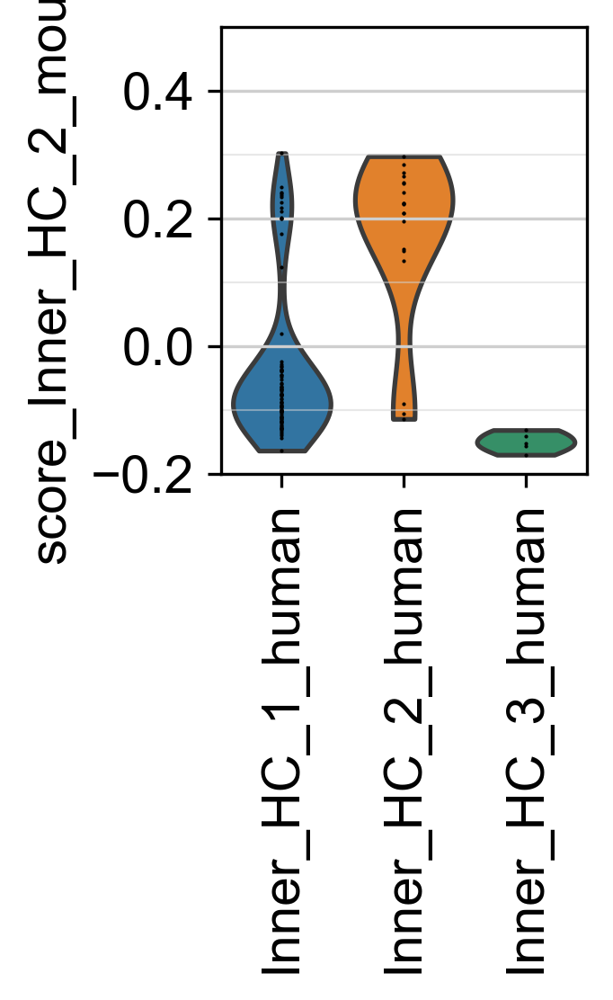

In [195]:
import matplotlib.pyplot as plt
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster2 = 'Inner_HC_2_mouse'
cluster_genes2 = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster2].sort_values('frac_diff', ascending=False).head(100)
gene_list2 = cluster_genes2.index.tolist() # 取第一列

print(f"Cluster {cluster2}: 使用 {len(gene_list2)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict_IHC, gene_list2, score_name=f'score_{cluster2}')
sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(2.5, 4))

# 在指定的坐标轴上绘制
sc.pl.violin(adata_human_strict_IHC, ['score_Inner_HC_2_mouse'], 
             groupby='devtime_age_bins_species',
             jitter=False, 
             rotation=90,
             ax=ax,
             show=False
            )

# 设置纵坐标范围
ax.set_ylim(-0.2, 0.5)

# 添加0.1间隔的水平分割线
for y in np.arange(-0.2, 0.6 + 0.1, 0.1):
    ax.axhline(y=y, color='lightgray', linestyle='-', linewidth=0.5, alpha=0.5)

# 保存
plt.tight_layout()
plt.savefig('human_ihc2_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

第一列的名称: top_frac_group
Cluster Inner_HC_3_mouse: 使用 100 个基因进行打分


<Axes: ylabel='score_Inner_HC_3_mouse'>

(-0.2, 0.6)

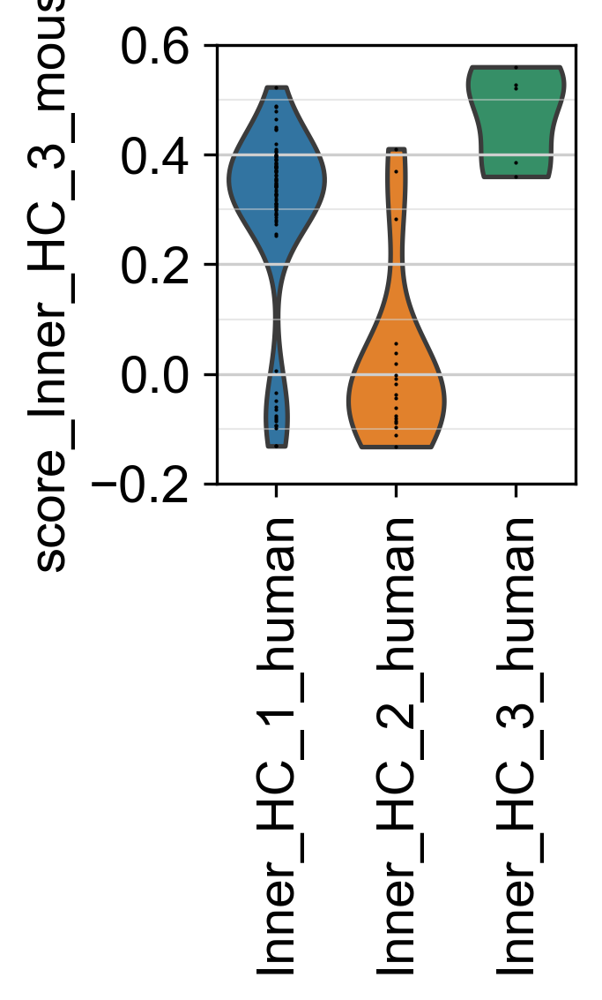

In [196]:
import matplotlib.pyplot as plt
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster3 = 'Inner_HC_3_mouse'
cluster_genes3 = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster3].sort_values('frac_diff', ascending=False).head(100)
gene_list3 = cluster_genes3.index.tolist() # 取第一列

print(f"Cluster {cluster3}: 使用 {len(gene_list3)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict_IHC, gene_list3, score_name=f'score_{cluster3}')
sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(2.5, 4))

# 在指定的坐标轴上绘制
sc.pl.violin(adata_human_strict_IHC, ['score_Inner_HC_3_mouse'], 
             groupby='devtime_age_bins_species',
             jitter=False, 
             rotation=90,
             ax=ax,
             show=False
            )

# 设置纵坐标范围
ax.set_ylim(-0.2, 0.6)

# 添加0.1间隔的水平分割线
for y in np.arange(-0.2, 0.6 + 0.1, 0.1):
    ax.axhline(y=y, color='lightgray', linestyle='-', linewidth=0.5, alpha=0.5)

# 保存
plt.tight_layout()
plt.savefig('human_ihc3_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

第一列的名称: top_frac_group
Cluster Outer_HC_1_mouse: 使用 24 个基因进行打分


<Axes: ylabel='score_Outer_HC_1_mouse'>

(-0.2, 0.6)

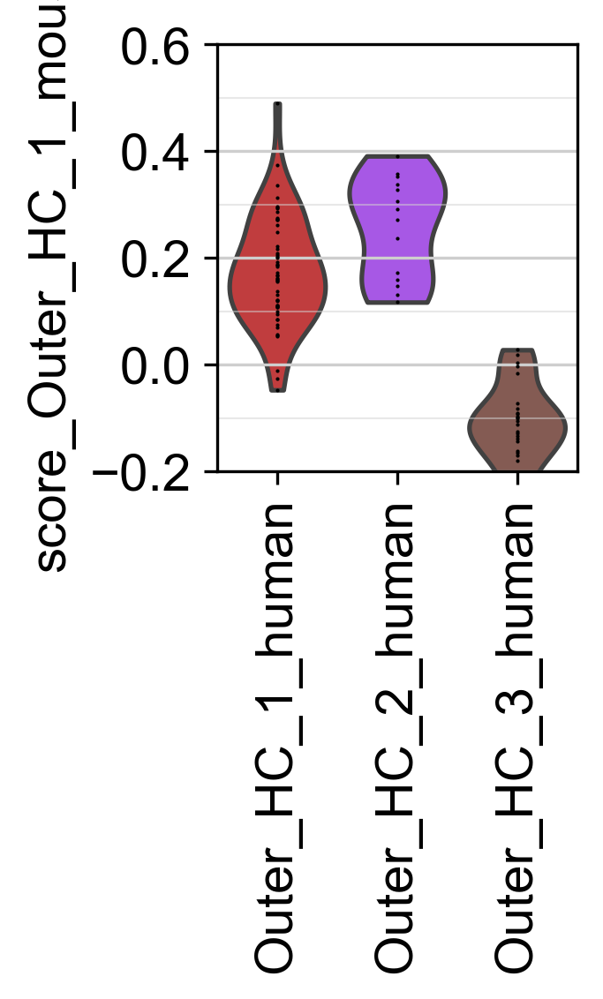

In [197]:
import matplotlib.pyplot as plt
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster4 = 'Outer_HC_1_mouse'
cluster_genes4 = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster4].sort_values('frac_diff', ascending=False).head(100)
gene_list4 = cluster_genes4.index.tolist() # 取第一列

print(f"Cluster {cluster4}: 使用 {len(gene_list4)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict_OHC, gene_list4, score_name=f'score_{cluster4}')
sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(2.5, 4))

# 在指定的坐标轴上绘制
sc.pl.violin(adata_human_strict_OHC, ['score_Outer_HC_1_mouse'], 
             groupby='devtime_age_bins_species',
             jitter=False, 
             rotation=90,
             ax=ax,
             show=False
            )

# 设置纵坐标范围
ax.set_ylim(-0.2, 0.6)

# 添加0.1间隔的水平分割线
for y in np.arange(-0.2, 0.6 + 0.1, 0.1):
    ax.axhline(y=y, color='lightgray', linestyle='-', linewidth=0.5, alpha=0.5)

# 保存
plt.tight_layout()
plt.savefig('human_ohc1_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

第一列的名称: top_frac_group
Cluster Outer_HC_2_mouse: 使用 100 个基因进行打分


<Axes: ylabel='score_Outer_HC_2_mouse'>

(-0.2, 0.6)

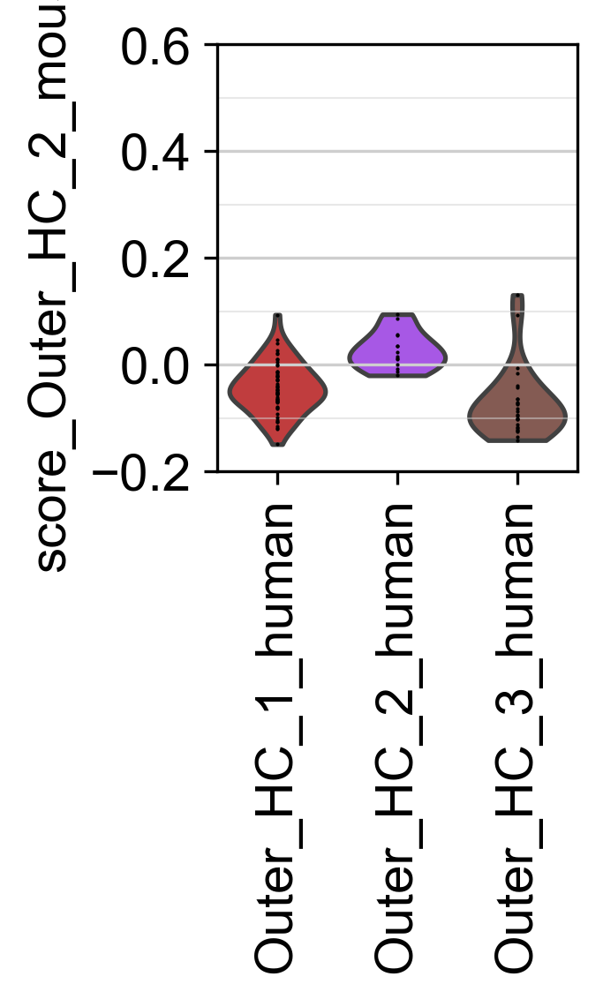

In [198]:
import matplotlib.pyplot as plt
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster5 = 'Outer_HC_2_mouse'
cluster_genes5 = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster5].sort_values('frac_diff', ascending=False).head(100)
gene_list5 = cluster_genes5.index.tolist() # 取第一列

print(f"Cluster {cluster5}: 使用 {len(gene_list5)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict_OHC, gene_list5, score_name=f'score_{cluster5}')
sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(2.5, 4))

# 在指定的坐标轴上绘制
sc.pl.violin(adata_human_strict_OHC, ['score_Outer_HC_2_mouse'], 
             groupby='devtime_age_bins_species',
             jitter=False, 
             rotation=90,
             ax=ax,
             show=False
            )

# 设置纵坐标范围
ax.set_ylim(-0.2, 0.6)

# 添加0.1间隔的水平分割线
for y in np.arange(-0.2, 0.6 + 0.1, 0.1):
    ax.axhline(y=y, color='lightgray', linestyle='-', linewidth=0.5, alpha=0.5)

# 保存
plt.tight_layout()
plt.savefig('human_ohc2_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

第一列的名称: top_frac_group
Cluster Outer_HC_3_mouse: 使用 100 个基因进行打分


<Axes: ylabel='score_Outer_HC_3_mouse'>

(-0.2, 0.6)

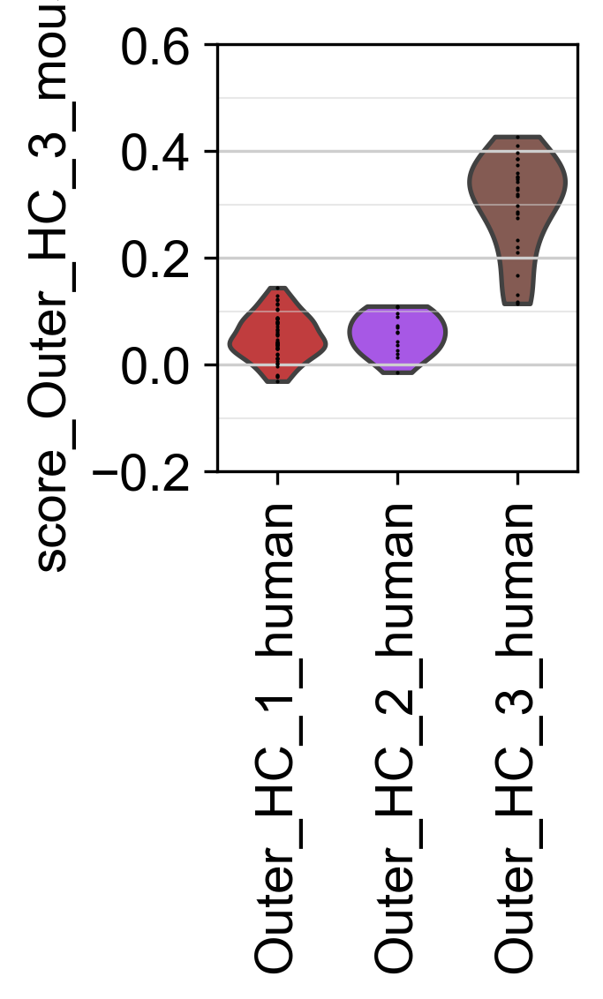

In [199]:
import matplotlib.pyplot as plt
# 查看第一列的名称
print("第一列的名称:", mks_MU_HC.columns[0])

# 如果第一列是基因列
cluster6 = 'Outer_HC_3_mouse'
cluster_genes6 = mks_MU_HC[mks_MU_HC['top_frac_group'] == cluster6].sort_values('frac_diff', ascending=False).head(100)
gene_list6 = cluster_genes6.index.tolist() # 取第一列

print(f"Cluster {cluster6}: 使用 {len(gene_list6)} 个基因进行打分")
sc.tl.score_genes(adata_human_strict_OHC, gene_list6, score_name=f'score_{cluster6}')
sc.set_figure_params(figsize=(2.5,3), frameon=False, dpi=150, dpi_save=600)

# 创建图形和坐标轴
fig, ax = plt.subplots(figsize=(2.5, 4))

# 在指定的坐标轴上绘制
sc.pl.violin(adata_human_strict_OHC, ['score_Outer_HC_3_mouse'], 
             groupby='devtime_age_bins_species',
             jitter=False, 
             rotation=90,
             ax=ax,
             show=False
            )

# 设置纵坐标范围
ax.set_ylim(-0.2, 0.6)

# 添加0.1间隔的水平分割线
for y in np.arange(-0.2, 0.6 + 0.1, 0.1):
    ax.axhline(y=y, color='lightgray', linestyle='-', linewidth=0.5, alpha=0.5)

# 保存
plt.tight_layout()
plt.savefig('human_ohc3_score.pdf', dpi=600, bbox_inches='tight')
plt.show()

In [223]:
import os
import tempfile
import scanpy as sc
import scvi
import seaborn as sns
import torch

In [317]:
#Reference mapping with scvi-tools
adata_query=adata_to.copy()
adata_query
adata_ref=adata_from.copy()
adata_ref

AnnData object with n_obs × n_vars = 109 × 16270
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_genes', 'sample', 'sample_id', 'sample_id2', 'donor', 'gw', 'gender', 'sequencing', 'dataset', 'percent_mito', 'n_counts', 'leiden_R', 'cell_type_final', 'cell_type_final_v4', 'S_score', 'G2M_score', 'phase', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet_scrub', 'X_scvi_batch', 'X_scvi_labels', 'age_bins', 'age_bins2', 'cellid', 'RNA_snn_res.0.8', 'seurat_clusters', 'cell_type_final_v4_age', 'devtime_age_bins', 'species', 'devtime_age_bins_species', 'score_Inner_HC_1_mouse', 'leiden_0.4', 'score_Inner_HC_2_mouse', 'score_Inner_HC_3_mouse', 'score_Outer_HC_1_mouse', 'score_Outer_HC_2_mouse', 'score_Outer_HC_3_mouse', 'predicted_celltype', 'celltype'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.v

AnnData object with n_obs × n_vars = 348 × 15870
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet', 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5', 'devtime', 'devtime_age_bins', 'age_bins2', 'species', 'devtime_age_bins_species', 'celltype'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0'

In [318]:
adata = anndata.concat([adata_query, adata_ref])
adata

AnnData object with n_obs × n_vars = 457 × 15492
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'age_bins2', 'RNA_snn_res.0.8', 'seurat_clusters', 'devtime_age_bins', 'species', 'devtime_age_bins_species', 'celltype'
    obsm: 'X_pca', 'X_umap'

In [319]:
#We run highly variable gene selection on the reference data and use these same genes for the query data.
sc.pp.highly_variable_genes(adata_ref, n_top_genes=3000, batch_key="species", subset=True)
adata_ref

AnnData object with n_obs × n_vars = 348 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.hb', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.2', 'SCT_snn_res.0.3', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.8', 'SCT_snn_res.0.9', 'SCT_snn_res.1', 'SCT_snn_res.1.1', 'SCT_snn_res.1.2', 'SCT_snn_res.1.3', 'SCT_snn_res.1.4', 'SCT_snn_res.1.5', 'SCT_snn_res.1.6', 'seurat_clusters', 'timepoint', 'subtype', 'RNA_snn_res.0.5', 'hctype', 'hc_type', 'RNA_snn_res.0.8', 'doublet_score', 'predicted_doublet', 'CellID', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'cell_type', 'cluster5', 'devtime', 'devtime_age_bins', 'age_bins2', 'species', 'devtime_age_bins_species', 'celltype'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0',

In [320]:
# Find genes present in both datasets
common_genes = adata_query.var_names.intersection(adata_ref.var_names)

# Subset both datasets to only these common genes
adata_query = adata_query[:, common_genes].copy()
adata_ref = adata_ref[:, common_genes].copy()

In [321]:
#We train the reference using the standard SCVI workflow, except we add a few non-default parameters that were identified to work well with scArches. 
#It is essential to encode covariates here as this allows scArches to map new batches in the encoder to the existing data and 
#thereby provides batch integration.
scvi.model.SCVI.setup_anndata(adata_ref, batch_key="species", )

In [322]:
scvi_ref = scvi.model.SCVI(
    adata_ref,
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)
scvi_ref.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/400 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=400` reached.


In [323]:
SCVI_LATENT_KEY = "X_scVI"
adata_ref.obsm[SCVI_LATENT_KEY] = scvi_ref.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata_ref)
sc.tl.umap(adata_ref)

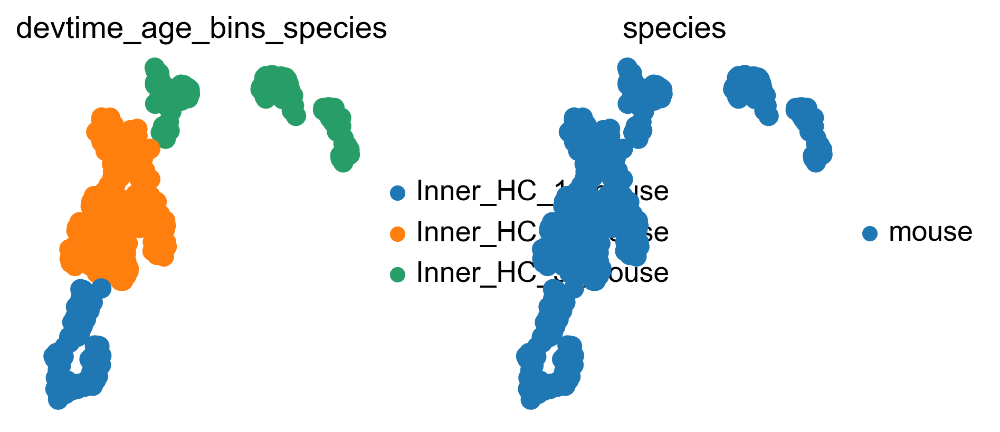

In [324]:
sc.pl.umap(
    adata_ref,
    color=["devtime_age_bins_species", "species"],
    frameon=False,
    ncols=2,
)

In [325]:
import os

# Define your custom save path
save_path = r"F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline"

# Create directory if it doesn't exist
os.makedirs(save_path, exist_ok=True)

# Define full model path and save
scvi_ref_path = os.path.join(save_path, "mouse_hc_scvi_ref")
scvi_ref.save(scvi_ref_path, overwrite=True)

In [326]:
#First we validate that our query data is ready to be loaded into the reference model.
#Here we run prepare_query_anndata, which reorders the genes and pads any missing genes with 0s. 
#This should generally be run before reference mapping with scArches to ensure data correctness. 
#In the case of this tutorial, nothing happens as the query data is already “correct”.
# both are valid
scvi.model.SCVI.prepare_query_anndata(adata_query, scvi_ref_path)
scvi.model.SCVI.prepare_query_anndata(adata_query, scvi_ref)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\mouse_hc_scvi_ref\model.pt already  
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Found 100.0% reference vars in query data.                                                                


In [327]:
#Now we create the new query model instance
# both are valid
scvi_query = scvi.model.SCVI.load_query_data(
    adata_query,
    scvi_ref_path,
)
scvi_query = scvi.model.SCVI.load_query_data(
    adata_query,
    scvi_ref,
)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\mouse_hc_scvi_ref\model.pt already  
         downloaded                                                                                                


In [328]:
# This is a typical SCVI object, and after training, can be used in any defined way.
#For training the query data, we recommend using a weight_decay of 0.0. 
#This ensures the latent representation of the reference cells will remain exactly the same if passing them through this new query model.
scvi_query.train(max_epochs=200, plan_kwargs={"weight_decay": 0.0})
adata_query.obsm[SCVI_LATENT_KEY] = scvi_query.get_latent_representation()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/200 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=200` reached.


In [329]:
sc.pp.neighbors(adata_query, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata_query)
sc.tl.umap(adata_query)

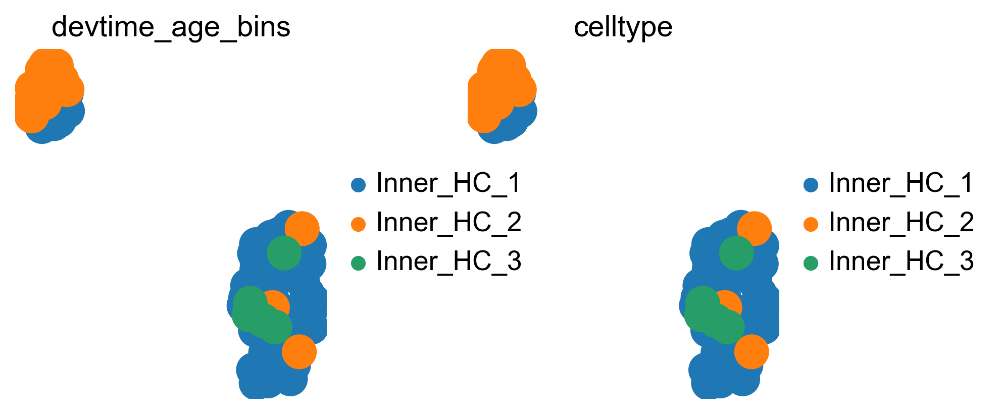

In [330]:
sc.pl.umap(
    adata_query,
    color=["devtime_age_bins", "celltype"],
    frameon=False,
    ncols=2,
)

In [331]:
adata_full = anndata.concat([adata_query, adata_ref])
adata_full

AnnData object with n_obs × n_vars = 457 × 2988
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'age_bins2', 'RNA_snn_res.0.8', 'seurat_clusters', 'devtime_age_bins', 'species', 'devtime_age_bins_species', 'celltype', '_scvi_batch', '_scvi_labels'
    obsm: 'X_pca', 'X_umap', 'X_scVI'

In [332]:
adata_full.obsm[SCVI_LATENT_KEY] = scvi_query.get_latent_representation(adata_full)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [333]:
sc.pp.neighbors(adata_full, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata_full)
sc.tl.umap(adata_full)

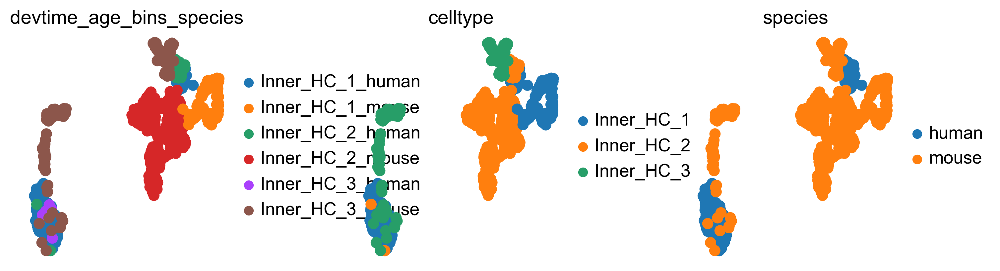

In [334]:
sc.pl.umap(
    adata_full,
    color=["devtime_age_bins_species", "celltype",'species'],
    frameon=False,wspace=0.5,
    ncols=3,
)

In [335]:
from scvi.model import SCVI, SCANVI

In [336]:
arches_params = {
    "n_layers": 2,               # Number of hidden layers
    "n_hidden": 128,             # Number of nodes per hidden layer
    "n_latent": 30,              # Dimensionality of latent space
    "dropout_rate": 0.1,         # Dropout rate
    "gene_likelihood": "nb",     # "nb" (negative binomial) or "zinb" (zero-inflated negative binomial)
    "use_layer_norm": "both",    # Normalization ("none", "encoder", "decoder", or "both")
    "use_batch_norm": "none"     # Batch normalization
}

In [337]:
scvi_model = SCVI(adata_ref, **arches_params)
scvi_model.train()
scanvi_model = SCANVI.from_scvi_model(scvi_model, unlabeled_category="Unknown",labels_key='celltype')
scanvi_model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/400 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=400` reached.


INFO     Training for 10 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/10 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


In [338]:
SCANVI_LABELS_KEY = "labels_scanvi"

adata_ref.obs[SCANVI_LABELS_KEY] = adata_ref.obs["celltype"].values

In [339]:
# unlabeled category does not exist in adata.obs[labels_key]
# so all cells are treated as labeled
scanvi_ref = scvi.model.SCANVI.from_scvi_model(
    scvi_ref,
    unlabeled_category="Unknown",
    labels_key=SCANVI_LABELS_KEY,
)

In [340]:
scanvi_ref.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/20 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [341]:
SCANVI_LATENT_KEY = "X_scANVI"

adata_ref.obsm[SCANVI_LATENT_KEY] = scanvi_ref.get_latent_representation()
sc.pp.neighbors(adata_ref, use_rep=SCANVI_LATENT_KEY)
sc.tl.leiden(adata_ref)
sc.tl.umap(adata_ref)

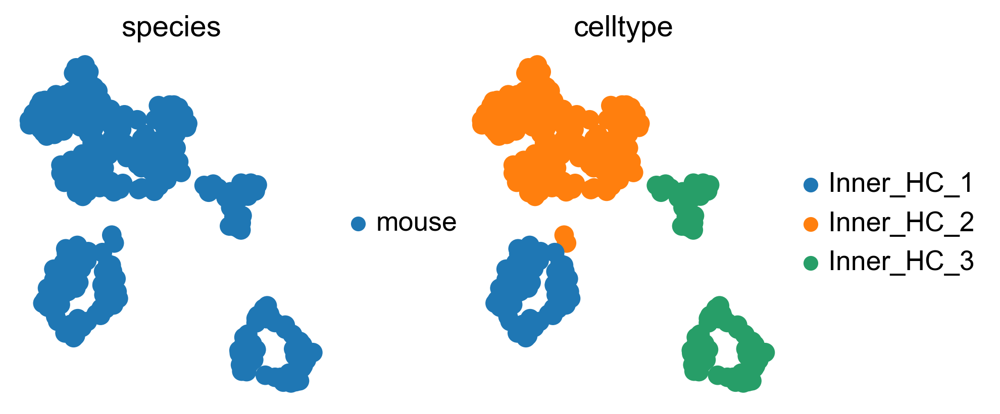

In [342]:
sc.pl.umap(
    adata_ref,
    color=["species", "celltype"],
    frameon=False,
    ncols=2,
)

In [343]:
scanvi_ref_path = os.path.join(save_path, "mouse_hc_scanvi_ref")
scanvi_ref.save(scanvi_ref_path, overwrite=True)

In [344]:
# again a no-op in this tutorial, but good practice to use
scvi.model.SCANVI.prepare_query_anndata(adata_query, scanvi_ref_path)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\mouse_hc_scanvi_ref\model.pt already
         downloaded                                                                                                
INFO     Found 100.0% reference vars in query data.                                                                


In [345]:
scanvi_query = scvi.model.SCANVI.load_query_data(adata_query, scanvi_ref_path)

INFO     File F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\mouse_hc_scanvi_ref\model.pt already
         downloaded                                                                                                


In [346]:
scanvi_query.train(
    max_epochs=100,
    plan_kwargs={"weight_decay": 0.0},
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                                                  


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


In [347]:
SCANVI_PREDICTIONS_KEY = "predictions_scanvi"

adata_query.obsm[SCANVI_LATENT_KEY] = scanvi_query.get_latent_representation()
adata_query.obs[SCANVI_PREDICTIONS_KEY] = scanvi_query.predict()

<Figure size 450x450 with 0 Axes>

Text(0.5, 0, 'Predicted')

Text(0, 0.5, 'Observed')

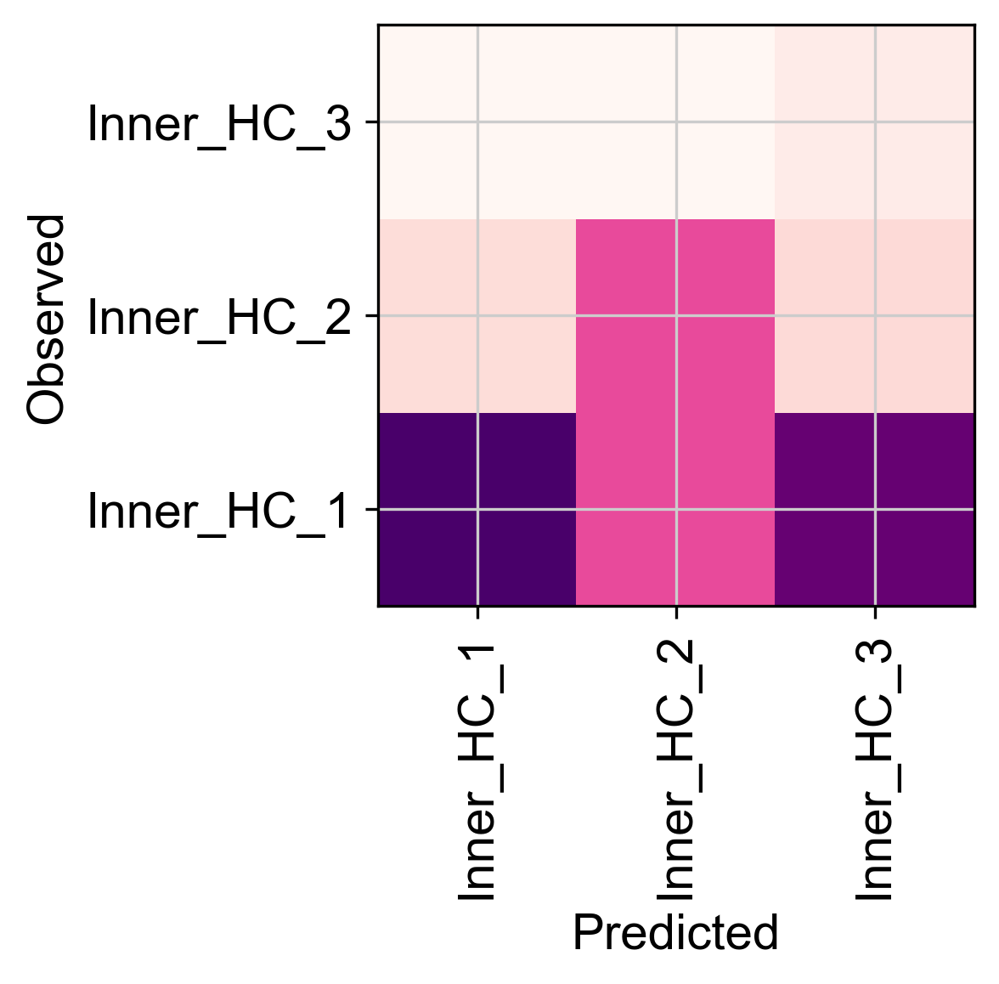

In [348]:
df = adata_query.obs.groupby(["celltype", SCANVI_PREDICTIONS_KEY]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(3, 3))
_ = plt.pcolor(norm_df,cmap='RdPu')
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

<Figure size 375x300 with 0 Axes>

Text(0.5, 0, 'Predicted')

Text(0, 0.5, 'Observed')

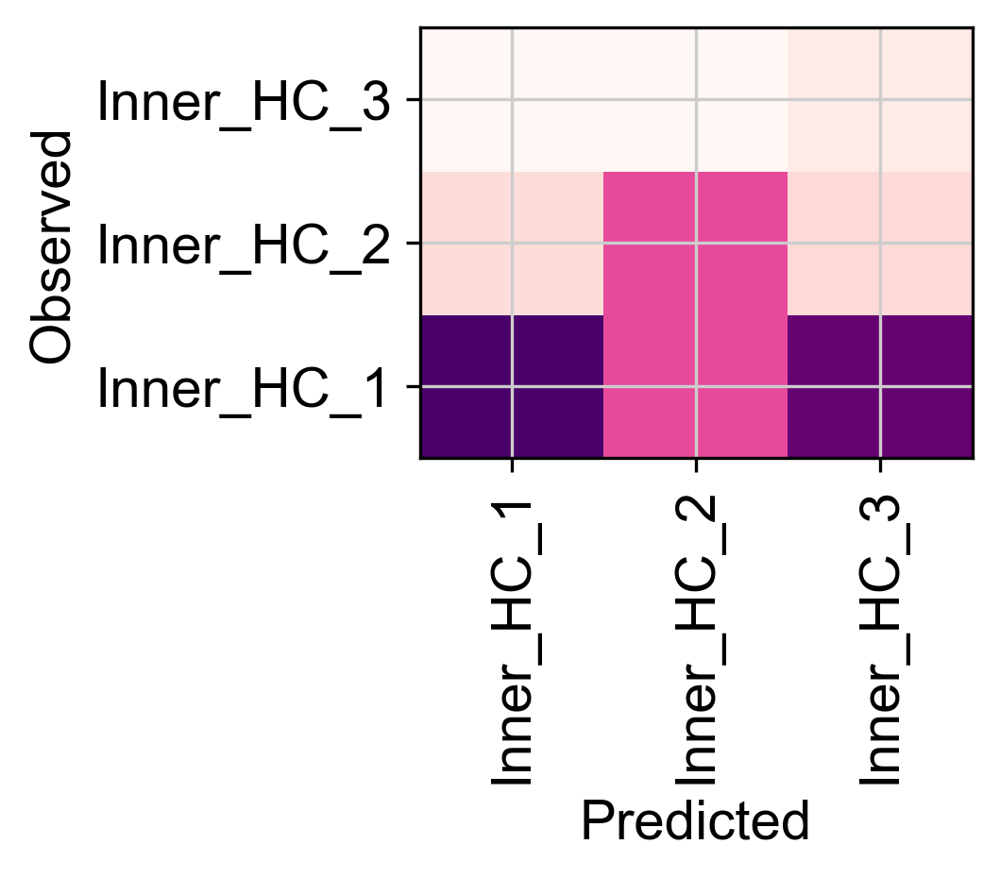

In [349]:
plt.figure(figsize=(2.5, 2))
_ = plt.pcolor(norm_df,cmap='RdPu')
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")
plt.savefig('CORRPLOT_HUMAN-MOUSE_HC_scvi_ref_mapping_3000HVGS.pdf')

In [224]:
# Load dataset we want to transfer label to
adata_to = adata_human_strict_IHC #organoid_coe_hc_strict_v2
print("adata_to dims: {}".format(adata_to.shape))

adata_to dims: (109, 16270)


In [225]:
adata_from=adata_mouse_strict_IHC
print("adata_from dims: {}".format(adata_from.shape))

adata_from dims: (348, 15870)


In [226]:
adata_to.obs['celltype']=adata_to.obs['devtime_age_bins']
adata_from.obs['celltype']=adata_from.obs['devtime_age_bins']

In [227]:
adata = anndata.concat([adata_to, adata_from])
adata

AnnData object with n_obs × n_vars = 457 × 15492
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'age_bins2', 'RNA_snn_res.0.8', 'seurat_clusters', 'devtime_age_bins', 'species', 'devtime_age_bins_species', 'celltype'
    obsm: 'X_pca', 'X_umap'

In [229]:
#adata = anndata.concat([adata_to, adata_from])
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # keep full dimension safe
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=1000,
    #layer="counts",
    batch_key="devtime_age_bins",
    subset=True,
)

In [231]:
scvi.model.SCVI.setup_anndata(adata,  batch_key="species")

In [232]:
scvi_model = scvi.model.SCVI(adata, n_layers=2, n_latent=30)

In [233]:
scvi_model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Training:   0%|          | 0/400 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=400` reached.


In [234]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = scvi_model.get_latent_representation()

In [236]:
# 使用UMAP替代MDE
import umap
SCVI_UMAP_KEY = "X_scVI_umap"

reducer = umap.UMAP(random_state=42, n_neighbors=15, min_dist=0.1)
adata.obsm[SCVI_UMAP_KEY] = reducer.fit_transform(adata.obsm[SCVI_LATENT_KEY])

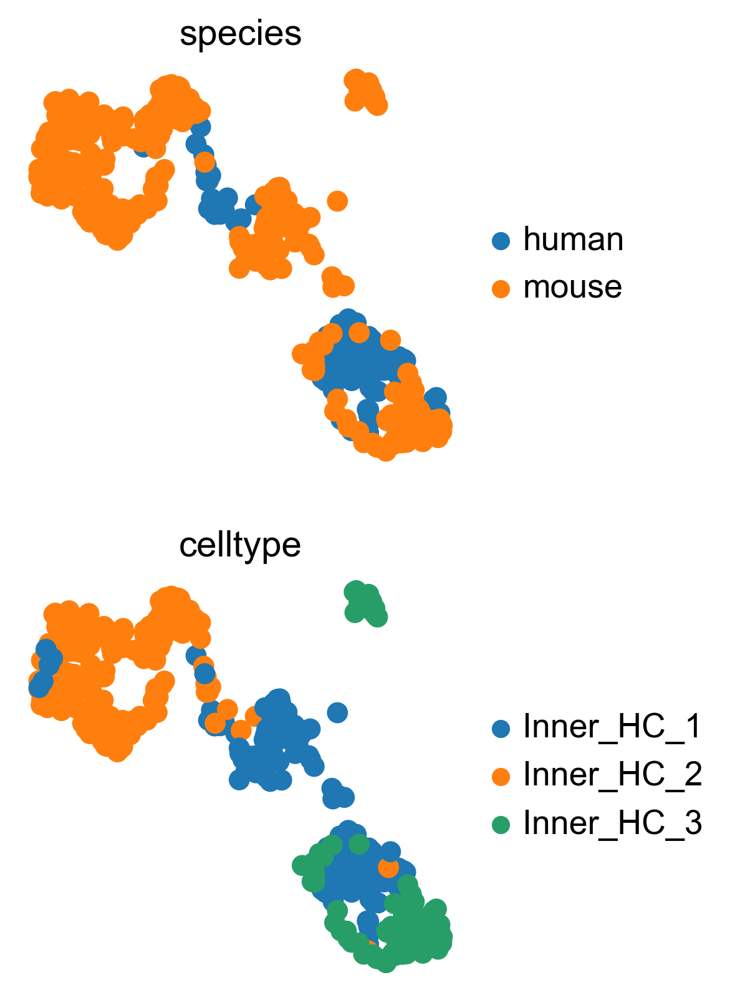

In [237]:
sc.pl.embedding(
    adata,
    basis=SCVI_UMAP_KEY,
    color=["species","celltype"],
    frameon=False,
    ncols=1,
)

In [238]:
SCANVI_CELLTYPE_KEY = "celltype_scanvi"

adata.obs[SCANVI_CELLTYPE_KEY] = "Unknown"
ss2_mask = adata.obs["species"] == "tissue"
adata.obs[SCANVI_CELLTYPE_KEY][ss2_mask] = adata.obs.celltype[ss2_mask].values

In [239]:
np.unique(adata.obs[SCANVI_CELLTYPE_KEY], return_counts=True)

(array(['Unknown'], dtype=object), array([457], dtype=int64))

In [240]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=adata,
    unlabeled_category="Unknown",
    labels_key=SCANVI_CELLTYPE_KEY,
)

ZeroDivisionError: division by zero